<h1 align="center"> Image Captioning With Attention</h1>

In this notebook you will teach network to use attention during captioning images.

Here is what we need to do:
1. Take pretrained VGG19 to build feature vectors for positions of images.
2. Stack LSTM with attention on top of that.
3. Train the model, draw attention maps.

This assignment is based on Alexander Panin's captioning assignment (https://github.com/yandexdataschool/Practical_DL/blob/spring2019/homework04/homework04_basic_part2_image_captioning.ipynb) and on the paper "Show, Attend and Tell" (https://arxiv.org/abs/1502.03044).

In [ ]:
# import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [ ]:
import json
import torch
if torch.cuda.is_available():
  device = 'cuda'
else:
  device = 'cpu'

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
from tqdm import tqdm
import h5py

In [ ]:
# you may need to install h5py, tqdm
#!pip install h5py tqdm
import sys
!{sys.executable} -m pip install h5py tqdm

## Data structure

To save your time, we've already vectorized all MSCOCO17 images with a pre-trained VGG19 network from [torchvision](https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py).

The whole process takes anywhere between a day on CPU and 30min on 1x GeForce GTX 1060. If you want to play with that yourself, [you're welcome](https://github.com/nadiinchi/dl_labs/blob/master/ht_attention_preprocess_data.ipynb).

Please either download data from [here](https://yadi.sk/d/KGh1SngBWH4stg) or generate it manually using the above script.

In [ ]:
!wget https://scisearch.ru/tdata/attention.zip
!unzip attention.zip

--2024-12-21 18:43:59--  https://scisearch.ru/tdata/attention.zip
Resolving scisearch.ru (scisearch.ru)... 176.57.217.55
Connecting to scisearch.ru (scisearch.ru)|176.57.217.55|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4034256125 (3.8G) [application/zip]
Saving to: ‘attention.zip’

attention.zip       100%[===================>]   3.76G  6.17MB/s    in 7m 59s  

2024-12-21 18:52:00 (8.03 MB/s) - ‘attention.zip’ saved [4034256125/4034256125]

Archive:  attention.zip
  inflating: attention/captions.json  
  inflating: attention/captions_tokenized.json  
  inflating: attention/img_codes.hdf5  


In [ ]:
f = h5py.File('/content/attention/img_codes.hdf5', 'r')
img_codes = f['data']

In [ ]:
captions = json.load(open('/content/attention/captions_tokenized.json'))

In [ ]:
print("Each image code is a 512x9x9-unit tensor [ shape: %s x %s ]" % (str(len(img_codes)), str(img_codes[0].shape)))
print(img_codes[0][:3].round(2), end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 512x9x9-unit tensor [ shape: 118287 x (512, 9, 9) ]
[[[0.   0.   0.   0.   0.07 0.69 0.   0.   0.  ]
  [0.   0.24 0.   0.   0.63 1.94 1.21 0.72 0.46]
  [0.77 0.76 0.   0.   0.   0.88 1.65 2.37 1.14]
  [0.21 0.   0.   0.   2.8  3.3  2.93 6.29 3.48]
  [0.   0.   0.   0.   3.29 3.81 2.24 2.76 0.01]
  [0.   0.   0.   1.18 0.32 0.08 0.   0.   0.  ]
  [1.02 1.76 0.89 1.77 0.   0.   0.   0.   0.  ]
  [0.   1.36 0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.09 0.3  0.  ]]

 [[0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.17 0.   0.   0.   0.   0.  ]
  [0.   0.95 0.   0.   0.   0.   0.   0.   0.  ]
  [0.34 1.5  0.   0.   0.36 0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.23 0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.52 0.   0.   0.  ]
  [0.   0.34 0.   0.   0.   0.   0.86 0.34 0.  ]
  [0.   0.47 0.26 0.41 0.   0.   1.08 0.38 0.  ]]

 [[1.09 3.03 2.15 0.65 0.   0.   1.06 0.2

As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [ ]:
#split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i]
        captions[img_i][caption_i] = ["#START#"]+sentence.split(' ')+["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts.

We want you to __count the occurences of each word__ so that we can decide which words to keep in our vocabulary.

In [ ]:
# Build a Vocabulary
from collections import Counter
word_counts = Counter()

#Compute word frequencies for each word in captions. See code above for data structure
# <YOUR CODE HERE>
for img in range(len(captions)):
    for caption in range(len(captions[img])):
        sentence = captions[img][caption]
        word_counts.update(sentence)  # Update the word frequencies

# Display the 10 most common words
print(word_counts.most_common(10))

[('a', 978125), ('#START#', 591435), ('#END#', 591435), ('.', 444651), ('on', 215537), ('of', 203940), ('the', 197668), ('in', 183933), ('with', 154705), ('and', 140709)]


In [ ]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [ ]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))

    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix

    return matrix

In [ ]:
#try it out on several descriptions of a random image
as_matrix(captions[1337])

array([[   1,   14,  287,  141,   14, 1130,  256,   62,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,  287,   62,   14, 1130,  256,  141,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,   90,  141,   14, 1291,   62,   44,    5,   14, 1287,
          13,    2,    3],
       [   1,   14, 1238, 1370,   14, 1291,   62,   14,   73,   74,   13,
           2,    3,    3],
       [   1,   14,   90,   18,   71,  342,  141,   14, 1291,   62,   14,
        1287,   13,    2]], dtype=int32)

## Building our neural network

As we mentioned earlier, we shall build an rnn "language-model" conditioned on the features from the convolutional part.

We'll unbox the inception net later to save memory, for now just pretend that it's available.

In [ ]:
import torch, torch.nn as nn
import torch.nn.functional as F

### Attention

There are $K$ objects that you can pay attention to.
Each object is characterized by the key $k_i$ and the value $v_i$.
The attention layer proceeds queries.
For the query $q$, the layer returns a weighted sum of the values of the objects, with weights proportional to the degree of key matching the query:
$$w_i = \frac{\exp(score(q, k_i))}{\sum_{j=1}^K\exp(score(q, k_j))}$$
$$a = \sum_{i=1}^K w_i v_i$$

Here we use $score(q, k) = \frac{q^Tk}{\sqrt{dim(k)}}$, where $dim(k)$ is the dimensionality of the key (which also equals the dimensionality of the query).
For more information see the paper Vaswani et al. "Attention Is All You Need", 2017.

_Hint:_ It is recommended to pay attention to the function torch.bmm, it may be useful below.

#### Score function layer

In [ ]:
class ScaledDotProductScore(nn.Module):
    """
    Vaswani et al. "Attention Is All You Need", 2017.
    """
    def __init__(self):
        super().__init__()

    def forward(self, queries, keys):
        """
        queries:  [batch_size x num_queries x dim]
        keys:     [batch_size x num_objects x dim]
        Returns a tensor of scores with shape [batch_size x num_queries x num_objects].
        """
        # <YOUR CODE HERE>

        d_k = queries.size(-1)
        scaling_f = torch.sqrt(torch.tensor(d_k, dtype=torch.float32, device=queries.device))
        result = torch.bmm(queries, keys.transpose(1, 2)) / scaling_f
        return result


Test for ScaledDotProductScore

In [ ]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


#### Attention layer

In [ ]:
class Attention(nn.Module):
    def __init__(self, scorer):
        super().__init__()
        self.scorer = scorer

    def forward(self, queries, keys, values):
        """
        queries:         [batch_size x num_queries x query_feature_dim]
        keys:            [batch_size x num_objects x key_feature_dim]
        values:          [batch_size x num_objects x obj_feature_dim]
        Returns matrix of responses for queries with shape [batch_size x num_queries x obj_feature_dim].
        Saves detached weights as self.attention_map.
        """
        scores = self.scorer(queries, keys)
        # <YOUR CODE HERE>
        weights = F.softmax(scores, dim=-1)
        self.last_weights = weights.detach()
        # <YOUR CODE HERE>
        result = torch.bmm(weights, values)
        return result

Tests for Attention layer

In [ ]:
attn = Attention(ScaledDotProductScore())

In [ ]:
q = torch.randn(2, 3, 5)
k = torch.randn(2, 4, 5)
v = torch.randn(2, 4, 7)
assert attn(q, k, v).shape == (2, 3, 7)

In [ ]:
q = torch.tensor([[
    [0.01],
    [1],
    [100],
]], dtype=torch.float32)
o = torch.tensor([[
    [-1],
    [0],
    [1],
]], dtype=torch.float32) * 1000
a = attn(q, o, o)
assert torch.isnan(attn.last_weights).sum() == 0
assert torch.isnan(a).sum() == 0

In [ ]:
q = torch.tensor([[
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
k = torch.tensor([[
    [0, 0],
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
v = torch.tensor([[
    [0],
    [1],
    [2],
]], dtype=torch.float32)
a = attn(q, k, v)
print('Attention map:\n', attn.last_weights)
print('Responses:\n', a)

Attention map:
 tensor([[[0.2483, 0.5035, 0.2483],
         [0.2483, 0.2483, 0.5035]]])
Responses:
 tensor([[[1.0000],
         [1.2552]]])


### Language model

In [ ]:
class CaptionNet(nn.Module):
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_channels=512):
        """ A recurrent 'head' network for image captioning. """
        super(self.__class__, self).__init__()

        # a layer that converts conv features to
        self.cnn_to_h0 = nn.Linear(cnn_channels, lstm_units)  # Initial LSTM hidden state
        self.cnn_to_c0 = nn.Linear(cnn_channels, lstm_units)  # Initial LSTM cell state

        # recurrent part, please create the layers as per scheme above.

        # create embedding for input words. Use the parameters (e.g. emb_size).
        self.emb = nn.Embedding(n_tokens, emb_size)

        # attention: create attention over image spatial positions
        # The query is previous lstm hidden state, the keys are transformed cnn features,
        # the values are cnn features
        self.attention = Attention(ScaledDotProductScore())

        # attention: create transform from cnn features to the keys
        # Hint: one linear layer shoud work
        # Hint: the dimensionality of keys should be lstm_units as lstm
        #       hidden state is the attention query
        self.cnn_to_attn_key = nn.Linear(cnn_channels, lstm_units)

        # lstm: create a recurrent core of your network. Use LSTMCell
        self.lstm = nn.LSTMCell(input_size=emb_size + cnn_channels, hidden_size=lstm_units)

        # create logits: MLP that takes attention response, lstm hidden state
        # and the previous word embedding as an input and computes one number per token
        # Hint: I used an architecture with one hidden layer, but you may try deeper ones
        self.logits_mlp = nn.Sequential(
            nn.Linear(lstm_units + cnn_channels + emb_size, lstm_units),  # First hidden layer
            nn.ReLU(),
            nn.Linear(lstm_units, n_tokens)  # Output layer for logits
        )

    def forward(self, image_features, captions_ix):
        """
        Apply the network in training mode.
        :param image_features: torch tensor containing VGG features for each position.
                               shape: [batch, cnn_channels, width * height]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i].
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """


        initial_cell = self.cnn_to_c0(image_features.mean(2))
        initial_hid = self.cnn_to_h0(image_features.mean(2))

        image_features = image_features.transpose(1, 2)

        # compute embeddings for captions_ix
        captions_emb = self.emb(captions_ix)

        # apply recurrent layer to captions_emb.
        # 1. initialize lstm state with initial_* from above
        # 2. In the recurrent loop over tokens:
        #   2.1. transform image vectors to the keys for attention
        #   2.2. use previous lstm state as an attention query and image vectors as values
        #   2.3. apply attention to obtain context vector
        #   2.4. store attention map
        #   2.5. feed lstm with current token embedding concatenated with context vector
        #   2.6. update lstm hidden and cell vectors
        #   2.7. store current lstm hidden state, attention response, and the previous word embedding
        # reccurent_out should be lstm hidden state sequence
        # of shape [batch, caption_length, lstm_units + cnn_channels + emb_size]
        # attention_map should be attention maps sequence
        # of shape [batch, caption_length, width * height]
        reccurent_out = []
        attention_map = []

        batch_size, caption_l, _ = captions_emb.shape
        h, c = initial_hid, initial_cell





        for t in range(caption_l):

            attn_key = self.cnn_to_attn_key(image_features)
            attn_query = h.unsqueeze(1)
            context_vector = self.attention(attn_query, attn_key, image_features)
            attention_map.append(self.attention.last_weights.squeeze(1))
            lstm_input = torch.cat([captions_emb[:, t, :], context_vector.squeeze(1)], dim=-1)
            h, c = self.lstm(lstm_input, (h, c))
            reccurent_out.append(torch.cat([h, context_vector.squeeze(1), captions_emb[:, t, :]], dim=-1))
        reccurent_out = torch.stack(reccurent_out, dim=1)
        logits = self.logits_mlp(reccurent_out)
        attention_map = torch.stack(attention_map, dim=1)
        return logits, attention_map





In [ ]:
network = CaptionNet(n_tokens).to(device)

In [ ]:
dummy_img_vec = torch.randn(len(captions[0]), 512, 81)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

dummy_img_vec = dummy_img_vec.to(device)
dummy_capt_ix = dummy_capt_ix.to(device)


dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)

print('logits shape:', dummy_logits.shape)
print('attention map shape:', dummy_attention_map.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)
assert dummy_attention_map.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], 81)

logits shape: torch.Size([5, 14, 10403])
attention map shape: torch.Size([5, 14, 81])


#### Train loss function

In [ ]:
def compute_loss(network, image_features, captions_ix, pad_ix):
    """
    :param image_features: torch tensor containing VGG features. shape: [batch, cnn_channels, width * height]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i].
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones plus
              attention regularizer. Scalar float tensor
    """
    if next(network.parameters()).is_cuda:
        image_features, captions_ix = image_features.cuda(), captions_ix.cuda()

    # captions for input - all except last cuz we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()

    # apply the network, get predictions, attnetion map and gates for captions_ix_next
    logits_for_next, attention_map = network.forward(image_features, captions_ix_inp)

    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask, Luke: make sure that predicting next tokens after EOS do not contribute to loss
    # you can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.

    loss = F.cross_entropy(logits_for_next.view(-1, logits_for_next.size(-1)),captions_ix_next.view(-1),ignore_index=pad_ix)

    # the regularizer for attention - this one requires the attention over each position to sum up to 1,
    # i. e. to look at the whole image during sentence generation process
    mask = (captions_ix_inp != pad_ix)  # [batch_size, caption_length-1]
    masked_attention_map = attention_map * mask[:, :, None].float()  # [batch_size, caption_length-1, num_objects]
    regularizer = ((1 - masked_attention_map.sum(1)) ** 2).mean()  # Regularize attention sum to 1

    return loss + regularizer


In [ ]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix, pad_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.detach().cpu().numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
        'loss should depend differentiably on all neural network weights'

#### Optimizer
Create ~~adam~~ your favorite optimizer for the network.

In [ ]:
# <YOUR CODE>
import torch.optim as optim
optimizer = optim.Adam(network.parameters(), lr=0.001)


optimizer.step()
optimizer.zero_grad()
# Always adam isn't it?




# Training

* First make train/val split without extra memory usage
* Implement the batch generator
* Than train the network as usual

In [ ]:
from torch.utils.data import Dataset

class IdxDataset(Dataset):
    def __init__(self, dataset, idx):
        self.dataset = dataset
        self.idx = idx

    def __len__(self):
        return len(self.idx)

    def __getitem__(self, idx):
        return self.dataset[self.idx[idx]]

In [ ]:
print(captions[5])

[['#START#', 'this', 'wire', 'metal', 'rack', 'holds', 'several', 'pairs', 'of', 'shoes', 'and', 'sandals', '#END#'], ['#START#', 'a', 'dog', 'sleeping', 'on', 'a', 'show', 'rack', 'in', 'the', 'shoes', '.', '#END#'], ['#START#', 'various', 'slides', 'and', 'other', 'footwear', 'rest', 'in', 'a', 'metal', 'basket', 'outdoors', '.', '#END#'], ['#START#', 'a', 'small', 'dog', 'is', 'curled', 'up', 'on', 'top', 'of', 'the', 'shoes', '#END#'], ['#START#', 'a', 'shoe', 'rack', 'with', 'some', 'shoes', 'and', 'a', 'dog', 'sleeping', 'on', 'them', '#END#']]


In [ ]:
captions = np.array(captions,dtype=object)

np.random.seed(42)
perm = np.random.permutation(len(img_codes))
threshold = round(len(img_codes) * 0.1)
train_img_idx, val_img_idx = perm[threshold:], perm[: threshold]

train_img_idx.sort()
val_img_idx.sort()
train_img_codes = IdxDataset(img_codes, train_img_idx)
val_img_codes = IdxDataset(img_codes, val_img_idx)
train_captions = IdxDataset(captions, train_img_idx)
val_captions = IdxDataset(captions, val_img_idx)

In [ ]:
from random import choice

last_batch_end = {}

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):

    #sample sequential numbers for image/caption indicies (for trainign speed up)
    global last_batch_end
    random_image_ix = np.arange(batch_size, dtype='int') + last_batch_end.get(len(img_codes), 0)
    last_batch_end[len(img_codes)] = last_batch_end.get(len(img_codes), 0) + batch_size
    if last_batch_end[len(img_codes)] + batch_size >= len(img_codes):
        last_batch_end[len(img_codes)] = 0

    #get images
    batch_images = np.vstack([img_codes[i][None] for i in random_image_ix])
    batch_images = batch_images.reshape(batch_images.shape[0], batch_images.shape[1], -1)

    #5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]

    #pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))

    #convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)

    return torch.tensor(batch_images, dtype=torch.float32).cuda(), torch.tensor(batch_captions_ix, dtype=torch.int64).cuda()


In [ ]:
generate_batch(img_codes, captions, 3)

(tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0941, 0.2962, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.0764, 0.3785, 0.0000],
          [1.0881, 3.0323, 2.1466,  ..., 0.9595, 1.1179, 0.9478],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0711,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.1465, 1.6479, 1.6033]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.3930, 0.9311],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ...,

### Main loop

Train on minibatches just as usual. Evaluate on val from time to time.

##### TIps
* If training loss has become close to 0 or model produces garbage,
    double-check that you're predicting __next__ words, not current or t+2'th words.
* If the model generates fluent captions that have nothing to do with the images
 * this may be due to recurrent net not receiving image vectors.
 * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
 * finally, you may just need to train the model a bit more


* Crossentropy is a poor measure of overfitting
 * Model can overfit validation crossentropy but keep improving validation quality.
 * Use human _(manual)_ evaluation or try automated metrics: [cider](https://github.com/vrama91/cider) or [bleu](https://www.nltk.org/_modules/nltk/translate/bleu_score.html)


* We recommend you to periodically evaluate the network using the next "apply trained model" block
 *  its safe to interrupt training, run a few examples and start training again

* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=3.5~3.7

In [ ]:
batch_size = 256  # adjust me
n_epochs = 64   # adjust me
n_batches_per_epoch = 32 # adjust me
n_validation_batches = 16  # how many batches are used for validation after each epoch

In [ ]:
from tqdm import tqdm

for epoch in range(n_epochs):
    if torch.cuda.is_available():
        network = network.cuda()

    train_loss = 0
    network.train(True)
    with tqdm(range(n_batches_per_epoch)) as iterator:
        for _ in iterator:
            # 获取批次数据
            img_batch, captions_batch = generate_batch(train_img_codes, train_captions, batch_size)
            img_batch, captions_batch = img_batch.cuda(), captions_batch.cuda()
            loss_t = compute_loss(network, img_batch, captions_batch, pad_ix=pad_ix)
            # clear old gradients; do a backward pass to get new gradients; then train with opt
            # <YOUR CODE>
            optimizer.zero_grad()
            loss_t.backward()
            torch.nn.utils.clip_grad_norm_(network.parameters(), 5.0)
            optimizer.step()
            train_loss += float(loss_t)
    train_loss /= n_batches_per_epoch

    val_loss = 0
    network.train(False)
    with torch.no_grad():
        for _ in range(n_validation_batches):
            img_batch, captions_batch = generate_batch(val_img_codes, val_captions, batch_size)## happened not on same device error, here we make sure it's on cuda
            img_batch, captions_batch = img_batch.cuda(), captions_batch.cuda()

            loss_t = compute_loss(network, img_batch, captions_batch, pad_ix=pad_ix)
            val_loss += float(loss_t)
    val_loss /= n_validation_batches

    print(f'\nEpoch: {epoch}, train loss: {train_loss:.4f}, val loss: {val_loss:.4f}', flush=True)

print("Finished!")


100%|██████████| 32/32 [00:13<00:00,  2.35it/s]



Epoch: 0, train loss: 7.4840, val loss: 6.6944


100%|██████████| 32/32 [00:12<00:00,  2.52it/s]



Epoch: 1, train loss: 6.2535, val loss: 5.8054


100%|██████████| 32/32 [00:13<00:00,  2.39it/s]



Epoch: 2, train loss: 5.4007, val loss: 5.0346


100%|██████████| 32/32 [00:14<00:00,  2.24it/s]



Epoch: 3, train loss: 4.8353, val loss: 4.6862


100%|██████████| 32/32 [00:13<00:00,  2.29it/s]



Epoch: 4, train loss: 4.5749, val loss: 4.4649


100%|██████████| 32/32 [00:13<00:00,  2.38it/s]



Epoch: 5, train loss: 4.3671, val loss: 4.3096


100%|██████████| 32/32 [00:13<00:00,  2.44it/s]



Epoch: 6, train loss: 4.2534, val loss: 4.1850


100%|██████████| 32/32 [00:13<00:00,  2.31it/s]



Epoch: 7, train loss: 4.1274, val loss: 4.0916


100%|██████████| 32/32 [00:13<00:00,  2.39it/s]



Epoch: 8, train loss: 4.0663, val loss: 4.0395


100%|██████████| 32/32 [00:13<00:00,  2.29it/s]



Epoch: 9, train loss: 4.0016, val loss: 3.9514


100%|██████████| 32/32 [00:13<00:00,  2.45it/s]



Epoch: 10, train loss: 3.9261, val loss: 3.9147


100%|██████████| 32/32 [00:14<00:00,  2.27it/s]



Epoch: 11, train loss: 3.8954, val loss: 3.8449


100%|██████████| 32/32 [00:13<00:00,  2.42it/s]



Epoch: 12, train loss: 3.8364, val loss: 3.8062


100%|██████████| 32/32 [00:12<00:00,  2.47it/s]



Epoch: 13, train loss: 3.7813, val loss: 3.7944


100%|██████████| 32/32 [00:14<00:00,  2.20it/s]



Epoch: 14, train loss: 3.7404, val loss: 3.7409


100%|██████████| 32/32 [00:13<00:00,  2.39it/s]



Epoch: 15, train loss: 3.6844, val loss: 3.7130


100%|██████████| 32/32 [00:13<00:00,  2.43it/s]



Epoch: 16, train loss: 3.6858, val loss: 3.6765


100%|██████████| 32/32 [00:13<00:00,  2.38it/s]



Epoch: 17, train loss: 3.6660, val loss: 3.6602


100%|██████████| 32/32 [00:14<00:00,  2.24it/s]



Epoch: 18, train loss: 3.6433, val loss: 3.6338


100%|██████████| 32/32 [00:12<00:00,  2.57it/s]



Epoch: 19, train loss: 3.6088, val loss: 3.5966


100%|██████████| 32/32 [00:13<00:00,  2.34it/s]



Epoch: 20, train loss: 3.6009, val loss: 3.5966


100%|██████████| 32/32 [00:13<00:00,  2.34it/s]



Epoch: 21, train loss: 3.5856, val loss: 3.5908


100%|██████████| 32/32 [00:14<00:00,  2.23it/s]



Epoch: 22, train loss: 3.5659, val loss: 3.5691


100%|██████████| 32/32 [00:12<00:00,  2.48it/s]



Epoch: 23, train loss: 3.5462, val loss: 3.5541


100%|██████████| 32/32 [00:14<00:00,  2.22it/s]



Epoch: 24, train loss: 3.5396, val loss: 3.5562


100%|██████████| 32/32 [00:14<00:00,  2.21it/s]



Epoch: 25, train loss: 3.4960, val loss: 3.5067


100%|██████████| 32/32 [00:13<00:00,  2.29it/s]



Epoch: 26, train loss: 3.4997, val loss: 3.5086


100%|██████████| 32/32 [00:13<00:00,  2.34it/s]



Epoch: 27, train loss: 3.4587, val loss: 3.5021


100%|██████████| 32/32 [00:13<00:00,  2.29it/s]



Epoch: 28, train loss: 3.4607, val loss: 3.4440


100%|██████████| 32/32 [00:14<00:00,  2.25it/s]



Epoch: 29, train loss: 3.4478, val loss: 3.4822


100%|██████████| 32/32 [00:14<00:00,  2.26it/s]



Epoch: 30, train loss: 3.4462, val loss: 3.4451


100%|██████████| 32/32 [00:13<00:00,  2.29it/s]



Epoch: 31, train loss: 3.4396, val loss: 3.4545


100%|██████████| 32/32 [00:14<00:00,  2.24it/s]



Epoch: 32, train loss: 3.4253, val loss: 3.4227


100%|██████████| 32/32 [00:14<00:00,  2.25it/s]



Epoch: 33, train loss: 3.4074, val loss: 3.4215


100%|██████████| 32/32 [00:13<00:00,  2.39it/s]



Epoch: 34, train loss: 3.3886, val loss: 3.4135


100%|██████████| 32/32 [00:13<00:00,  2.31it/s]



Epoch: 35, train loss: 3.3853, val loss: 3.3916


100%|██████████| 32/32 [00:13<00:00,  2.30it/s]



Epoch: 36, train loss: 3.3960, val loss: 3.4096


100%|██████████| 32/32 [00:14<00:00,  2.20it/s]



Epoch: 37, train loss: 3.3814, val loss: 3.4119


100%|██████████| 32/32 [00:14<00:00,  2.26it/s]



Epoch: 38, train loss: 3.3690, val loss: 3.3618


100%|██████████| 32/32 [00:13<00:00,  2.29it/s]



Epoch: 39, train loss: 3.3404, val loss: 3.4059


100%|██████████| 32/32 [00:13<00:00,  2.31it/s]



Epoch: 40, train loss: 3.3326, val loss: 3.3926


100%|██████████| 32/32 [00:14<00:00,  2.14it/s]



Epoch: 41, train loss: 3.3179, val loss: 3.3734


100%|██████████| 32/32 [00:14<00:00,  2.18it/s]



Epoch: 42, train loss: 3.3127, val loss: 3.3368


100%|██████████| 32/32 [00:14<00:00,  2.27it/s]



Epoch: 43, train loss: 3.3421, val loss: 3.3683


100%|██████████| 32/32 [00:14<00:00,  2.15it/s]



Epoch: 44, train loss: 3.3220, val loss: 3.3651


100%|██████████| 32/32 [00:14<00:00,  2.28it/s]



Epoch: 45, train loss: 3.3065, val loss: 3.3362


100%|██████████| 32/32 [00:13<00:00,  2.29it/s]



Epoch: 46, train loss: 3.2987, val loss: 3.3424


100%|██████████| 32/32 [00:14<00:00,  2.21it/s]



Epoch: 47, train loss: 3.2969, val loss: 3.3394


100%|██████████| 32/32 [00:14<00:00,  2.21it/s]



Epoch: 48, train loss: 3.3054, val loss: 3.3103


100%|██████████| 32/32 [00:13<00:00,  2.31it/s]



Epoch: 49, train loss: 3.2773, val loss: 3.3447


100%|██████████| 32/32 [00:14<00:00,  2.15it/s]



Epoch: 50, train loss: 3.2708, val loss: 3.3344


100%|██████████| 32/32 [00:14<00:00,  2.26it/s]



Epoch: 51, train loss: 3.2613, val loss: 3.3173


100%|██████████| 32/32 [00:14<00:00,  2.22it/s]



Epoch: 52, train loss: 3.2635, val loss: 3.3310


100%|██████████| 32/32 [00:13<00:00,  2.33it/s]



Epoch: 53, train loss: 3.2734, val loss: 3.3054


100%|██████████| 32/32 [00:14<00:00,  2.20it/s]



Epoch: 54, train loss: 3.2415, val loss: 3.3220


100%|██████████| 32/32 [00:14<00:00,  2.26it/s]



Epoch: 55, train loss: 3.2395, val loss: 3.2784


100%|██████████| 32/32 [00:14<00:00,  2.27it/s]



Epoch: 56, train loss: 3.2424, val loss: 3.3018


100%|██████████| 32/32 [00:14<00:00,  2.28it/s]



Epoch: 57, train loss: 3.2310, val loss: 3.2956


100%|██████████| 32/32 [00:14<00:00,  2.24it/s]



Epoch: 58, train loss: 3.2378, val loss: 3.2893


100%|██████████| 32/32 [00:14<00:00,  2.25it/s]



Epoch: 59, train loss: 3.2352, val loss: 3.2800


100%|██████████| 32/32 [00:13<00:00,  2.33it/s]



Epoch: 60, train loss: 3.2316, val loss: 3.2847


100%|██████████| 32/32 [00:14<00:00,  2.16it/s]



Epoch: 61, train loss: 3.2279, val loss: 3.2698


100%|██████████| 32/32 [00:14<00:00,  2.24it/s]



Epoch: 62, train loss: 3.2128, val loss: 3.2960


100%|██████████| 32/32 [00:14<00:00,  2.20it/s]



Epoch: 63, train loss: 3.2366, val loss: 3.2310
Finished!


### Apply trained model

Let's unpack our pre-trained VGG network and see what our model is capable of.

In [ ]:
from torch import nn
import torch.nn.functional as F
from torchvision.models.vgg import VGG, cfgs as VGG_cfgs, make_layers
from warnings import warn
class BeheadedVGG19(VGG):
    """ Like torchvision.models.inception.Inception3 but the head goes separately """

    def forward(self, x):
        x_for_attn = x= self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        logits = x = self.classifier(x)
        return x_for_attn, logits

features_net = BeheadedVGG19(make_layers(VGG_cfgs['E'], batch_norm=False), init_weights=False)

from torch.utils.model_zoo import load_url
features_net_url = 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth'
features_net.load_state_dict(load_url(features_net_url))

features_net = features_net.train(False)
if torch.cuda.is_available():
    features_net = features_net.cuda()
features_net = nn.DataParallel(features_net)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 173MB/s]


### Generate caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [ ]:
def generate_caption(image, caption_prefix = ("#START#",),
                     t=1, sample=True, max_len=100):

    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >=0 and image.shape[-1] == 3

    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)

    vectors_9x9, logits = features_net(image[None])
    caption_prefix = list(caption_prefix)

    attention_maps = []

    for _ in range(max_len):

        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        input_features = vectors_9x9.view(vectors_9x9.shape[0], vectors_9x9.shape[1], -1)
        if next(network.parameters()).is_cuda:
            input_features, prefix_ix = input_features.cuda(), prefix_ix.cuda()
        else:
            input_features, prefix_ix = input_features.cpu(), prefix_ix.cpu()
        next_word_logits, cur_attention_map = network(input_features, prefix_ix)
        next_word_logits = next_word_logits[0, -1]
        cur_attention_map = cur_attention_map[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().cpu().numpy()
        attention_maps.append(cur_attention_map.detach().cpu())

        assert len(next_word_probs.shape) ==1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs)
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word=="#END#":
            break

    return caption_prefix, attention_maps

Here is the code which downloads image, prints different generated captions and visualize attention map.

In [ ]:
from matplotlib import pyplot as plt
from skimage.transform import resize
from tempfile import mktemp
from os import remove
import numpy as np
from io import BytesIO
import requests
from PIL import Image
%matplotlib inline


def obtain_image(filename=None, url=None):
    if (filename is None and url is None) or (filename is not None and url is not None):
        raise ValueError('You should specify either filename or url')

    # Download image from URL if url is provided
    if url is not None:
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
    else:  # Load image from filename
        img = Image.open(filename)

    # Convert the image to RGB (in case it's grayscale or has an alpha channel)
    img = img.convert('RGB')

    # Convert image to numpy array
    img = np.array(img)

    # Resize image to (299, 299)
    img = resize(img, (299, 299), mode='reflect', anti_aliasing=True).astype('float32')

    return img

def show_img(img):
    plt.imshow(img)
    plt.axis('off')

def print_possible_captions(img, num_captions=10, temperature=5.):
    for i in range(num_captions):
        print(' '.join(generate_caption(img, t=temperature)[0][1:-1]))

def draw_attention_map(img, caption, attention_map):
    s = 4
    n = len(caption)
    w = 4
    h = n // w + 1
    plt.figure(figsize=(w * s, h * s))
    plt.subplot(h, w, 1)
    plt.imshow(img)
    plt.title('INPUT', fontsize=s * 4)
    plt.axis('off')
    for i, word, attention in zip(range(n), caption, attention_map):
        plt.subplot(h, w, 2 + i)
        attn_map = attention.view(1, 1, 9, 9)
        attn_map = F.interpolate(attn_map, size=(12, 12), mode='nearest')
        attn_map = F.interpolate(attn_map, size=(299, 299), mode='bilinear', align_corners=False)
        attn_map = attn_map[0, 0][:, :, None]
        attn_map = torch.min(attn_map / attn_map.max(), torch.ones_like(attn_map)).numpy()
        plt.imshow(img * attn_map)
        plt.title(word, fontsize=s * 4)
        plt.axis('off')

def process_image(img):
    print_possible_captions(img)
    c, am = generate_caption(img, t=5.)
    draw_attention_map(img, c[1:-1], am)

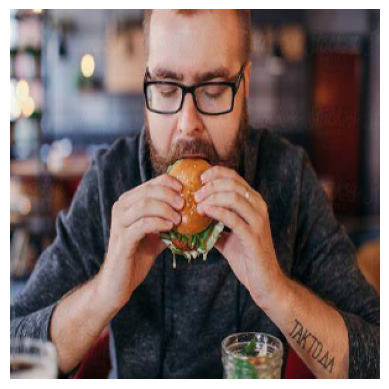

In [ ]:
img = obtain_image(url="https://th.bing.com/th/id/OIP.qT1t9gBSZZyozbUgZKhXzwHaE8?rs=1&pid=ImgDetMain")
show_img(img)#cant obatain original image in the notebook

a woman holding a hot dog in a red shirt .
a man is eating a hot dog in a restaurant .
a man holding a hot dog in a restaurant .
a man is eating a hot dog with a sandwich .
a man holding a hot dog in his hand .
a man is eating a hot dog with a sandwich .
a woman eating a hot dog in a restaurant .
a woman holding a hot dog in front of a table .
a man holding a hot dog in his hand .
a man holding a hot dog in a hand .


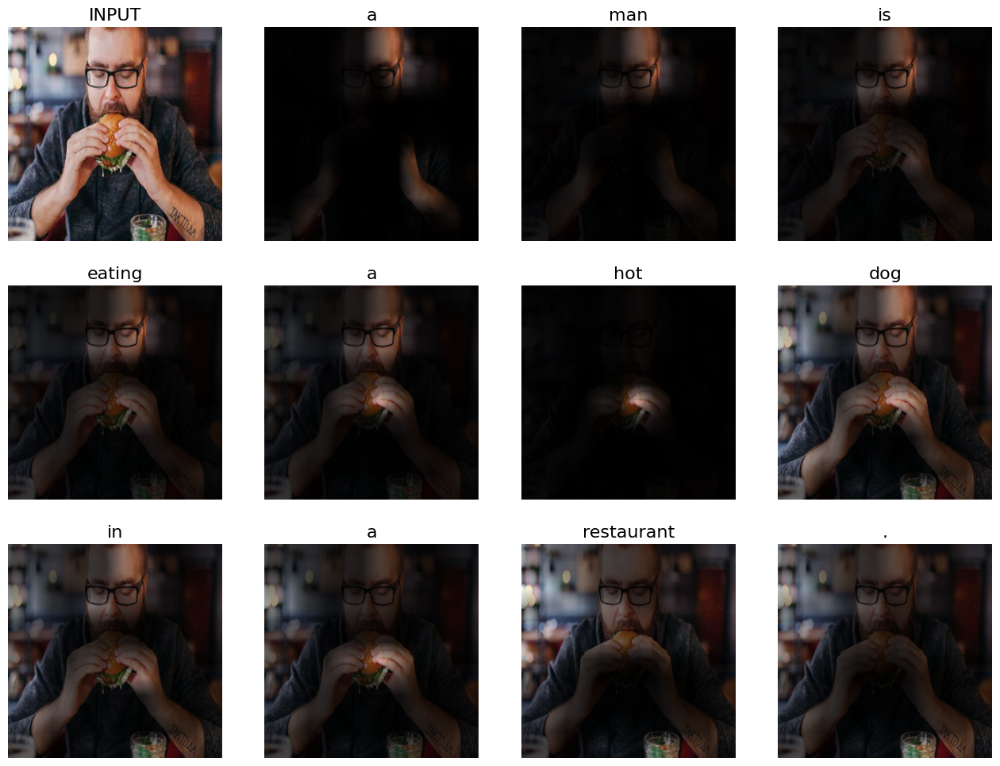

In [ ]:
process_image(img)

a man riding a bicycle on a rail road .
a man riding a bicycle on a rail road .
a man riding a bicycle on a rail road .
a man riding a bicycle on a rail road .
a man riding a bicycle on a rail road .
a man riding a bicycle on a rail road .
a man riding a bicycle on a rail .
a man is riding a bicycle on a rail .
a man on a bike is riding a bike .
a man riding a bicycle down a road .


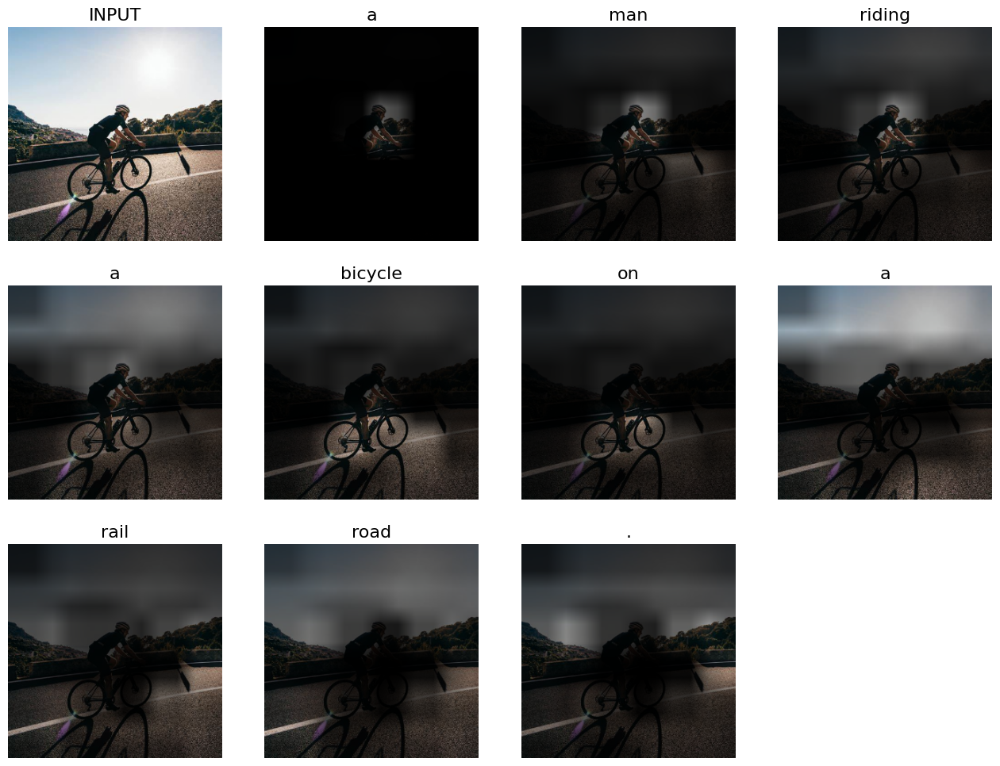

In [ ]:
## here it works perfectly
process_image(obtain_image(url="https://th.bing.com/th/id/OIP.oReeKjc8bp0e55S1TwXIPQHaHa?rs=1&pid=ImgDetMain"))

In [ ]:
##process_image(obtain_image(url="http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg"))

a man riding a skateboard on a rail .
a man riding a skateboard on a rail .
a man riding a skateboard on a ramp .
a man riding a skateboard on a rail .
a young man is doing a trick on a skateboard .
a man is doing a trick in the air .
a young man riding a skateboard on a ramp .
a man is doing a trick on a skateboard .
a man is riding a skateboard down a ramp .
a man is riding a skateboard down a ramp .


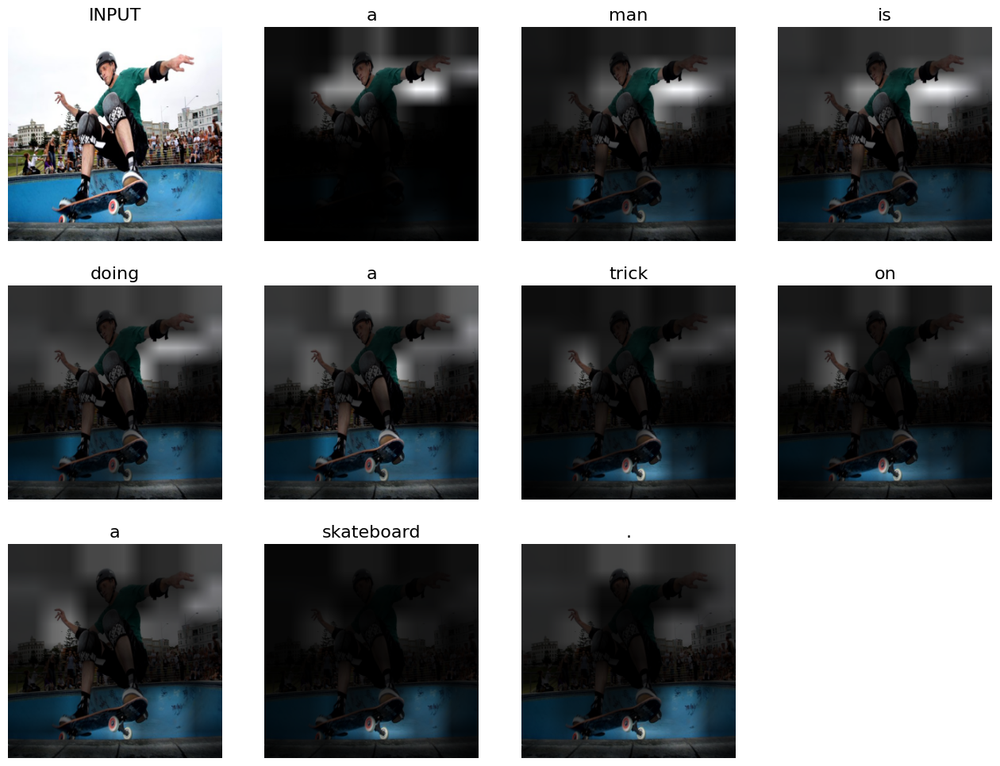

In [ ]:
process_image(obtain_image(url="https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg"))

In [ ]:
##process_image(obtain_image(filename="/home/oleg/usa00/IMG_20190520_125121.jpg"))

# Demo
### Find at least 10 images to test it on.
* Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
* Make sure it works okay on __simple__ images before going to something more comples
* Photos, not animation/3d/drawings, unless you want to train CNN network on anime
* Mind the aspect ratio

a man is holding a hot dog in his hand .
a man is standing in the middle of a green shirt .
a man is talking on a cell phone .
a man is holding a hot dog in his hand .
a man is standing in the middle of a blue and white bed .
a man is holding a hot dog in his hand .
a man is holding a hot dog in his hand .
a man is holding a hot dog in his hand .
a man is holding a hot dog in his hand .
a man is holding a hot dog in his hand .


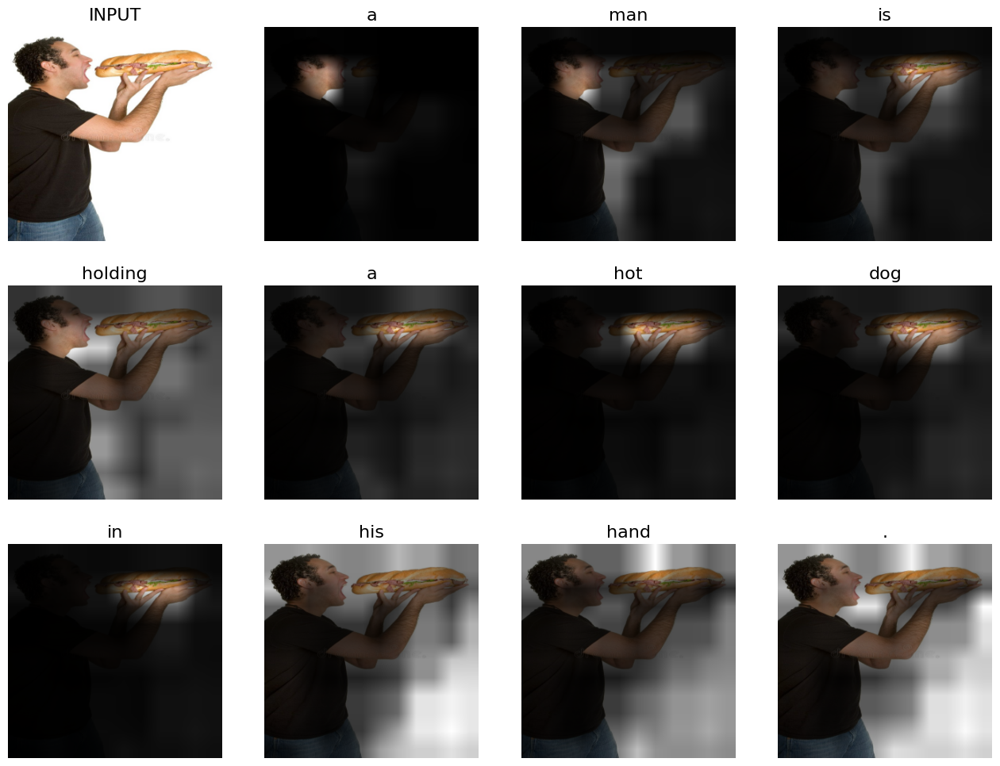

In [ ]:
#apply your network on image sample you found
#
#
process_image(obtain_image(url="https://i.pinimg.com/736x/7d/c8/59/7dc85907e75b1e18913b01625f0cd553.jpg"))

a man is walking on a beach with a surfboard .
a man is on a beach with a surfboard .
a man is in the air on a surfboard .
a man is on the beach with a surfboard .
a man standing on a beach holding a frisbee .
a man is standing on a beach holding a tennis racquet .
a man is on a beach with a surfboard .
a man is standing on the beach with a surfboard .
a man is standing on a beach with a surfboard .
a man is standing on a beach with a surfboard .


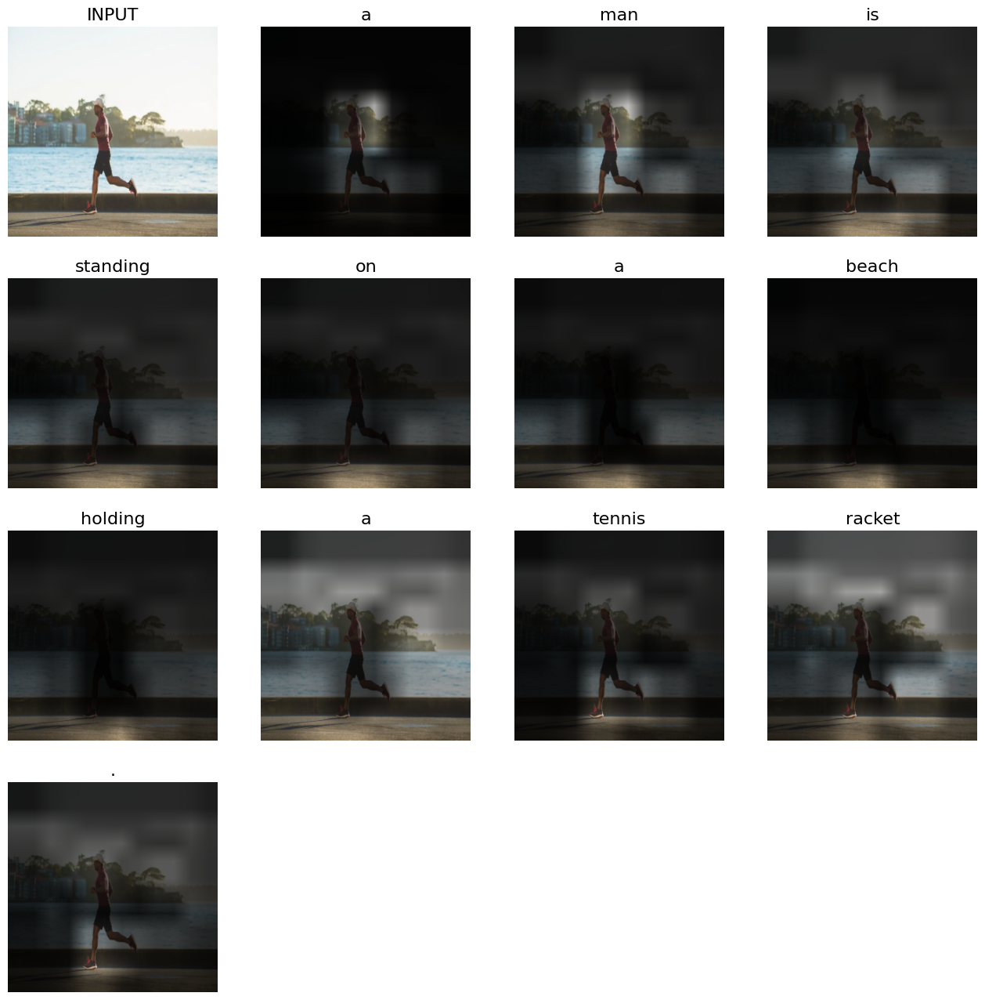

In [ ]:
#https://th.bing.com/th/id/OIP.wRzO5uRoPg0x3Gdi6qd3SQHaEK?rs=1&pid=ImgDetMain
process_image(obtain_image(url="https://th.bing.com/th/id/R.2eead7335abe385ec86cac64b3dae75d?rik=pQvJ1p3C0N%2fQow&riu=http%3a%2f%2fd.ifengimg.com%2fq100%2fimg1.ugc.ifeng.com%2fnewugc%2f20220324%2f10%2fwemedia%2fd55c922832f4b749a2b3a4f4d43097e35746d9a3_size65_w1080_h719.jpg&ehk=TwOg9FhWTseap7955m6tSe%2fC%2bSHJFKXHZKIR8Fm5o58%3d&risl=&pid=ImgRaw&r=0"))

a woman with a pink tie and a pink hat .
a woman with a pink flower and a pink tie .
a woman with a pink dress and a pink hat .
a woman with a pink dress and a pink hat .
a woman with a pink tie and a pink hat .
a woman holding a pink flower in her hand .
a woman with a pink dress and a pink hat .
a woman wearing a pink dress and a pink dress and a red tie .
a woman with a pink tie and a pink tie .
a woman with a pink tie and a pink hat .


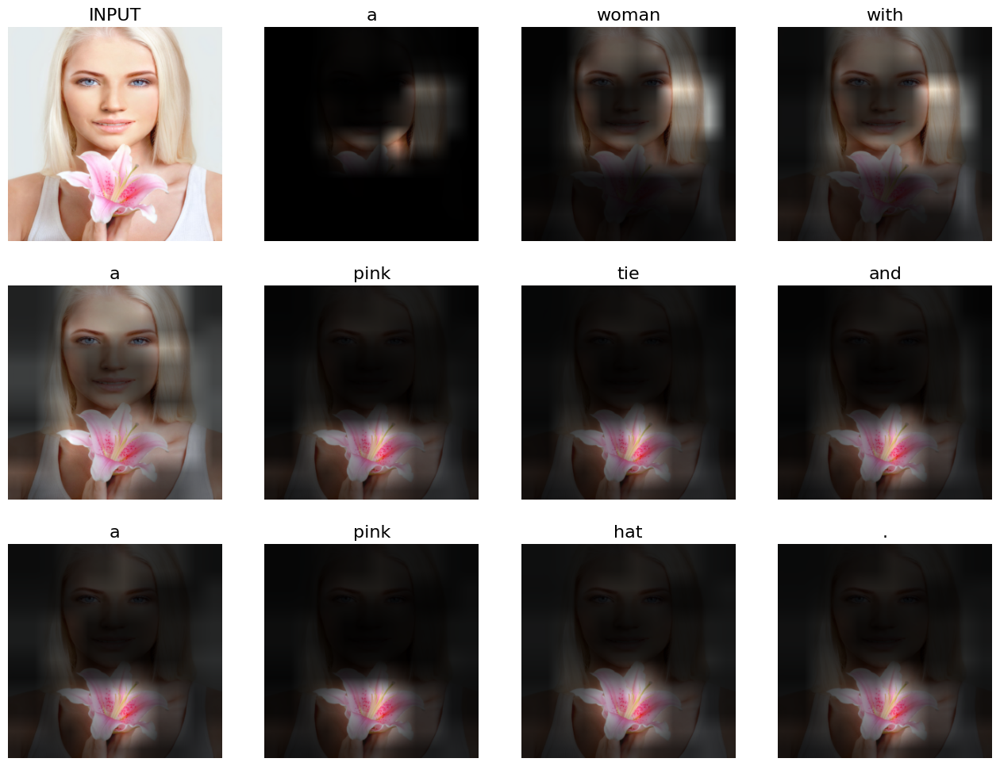

In [ ]:
## attention repeatedly focus on the same feature
process_image(obtain_image(url="https://pic.52112.com/180529/JPG-180529_44/H4XcIT3gY5_small.jpg"))

a young boy holding a baseball bat in his hand .
a young girl is holding a baseball bat in the background .
a young boy holding a baseball bat in his hand .
a woman holding a red frisbee in his hand .
a woman holding a frisbee in his hand .
a young boy is holding a small child
a young boy playing with a frisbee in the background .
a woman holding a baby ball in his hand .
a woman holding a frisbee in his hand .
a woman holding a frisbee in his hand .


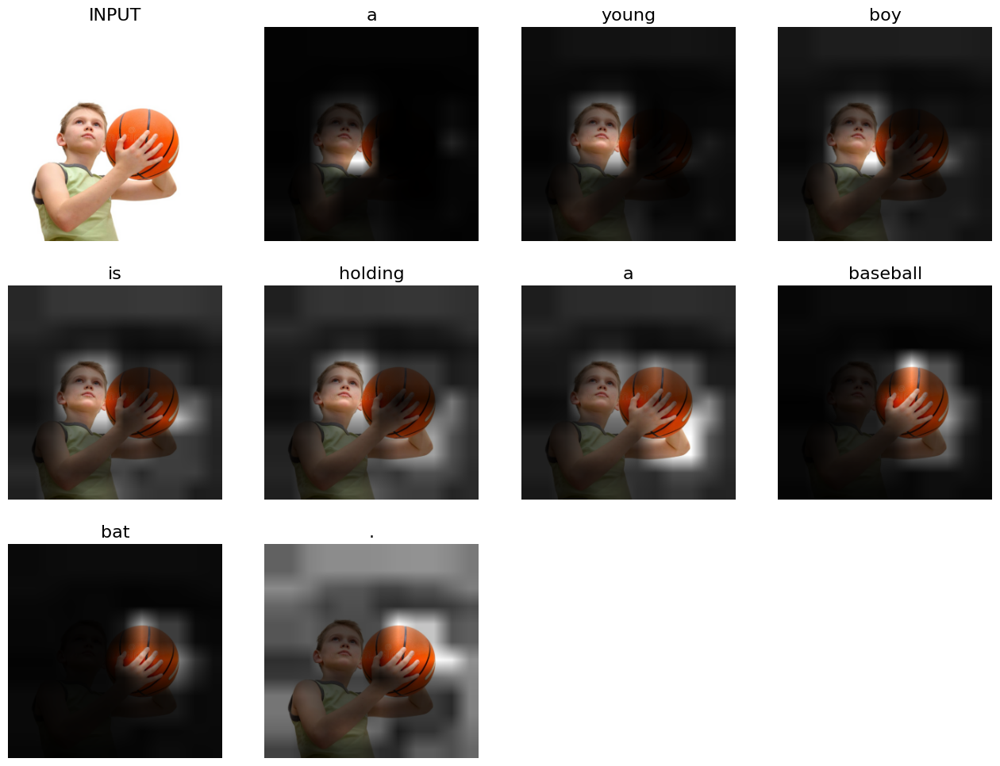

In [ ]:
## dont know where this problem come from
process_image(obtain_image(url="https://thumbs.dreamstime.com/b/%E6%9C%89%E7%AF%AE%E7%90%83%E7%9A%84%E5%B0%8F%E7%94%B7%E5%AD%A9-86008033.jpg"))

a dog is walking down a road with a dog .
a dog is standing on a white surface .
a dog is laying down on a leash .
a dog is playing with a dog on the ground .
a dog is standing in the grass with a dog .
a dog is standing on a green field .
a dog is standing on a green field .
a dog is walking down a road with a dog .
a dog is standing in the grass with a dog .
a dog is standing on a green field .


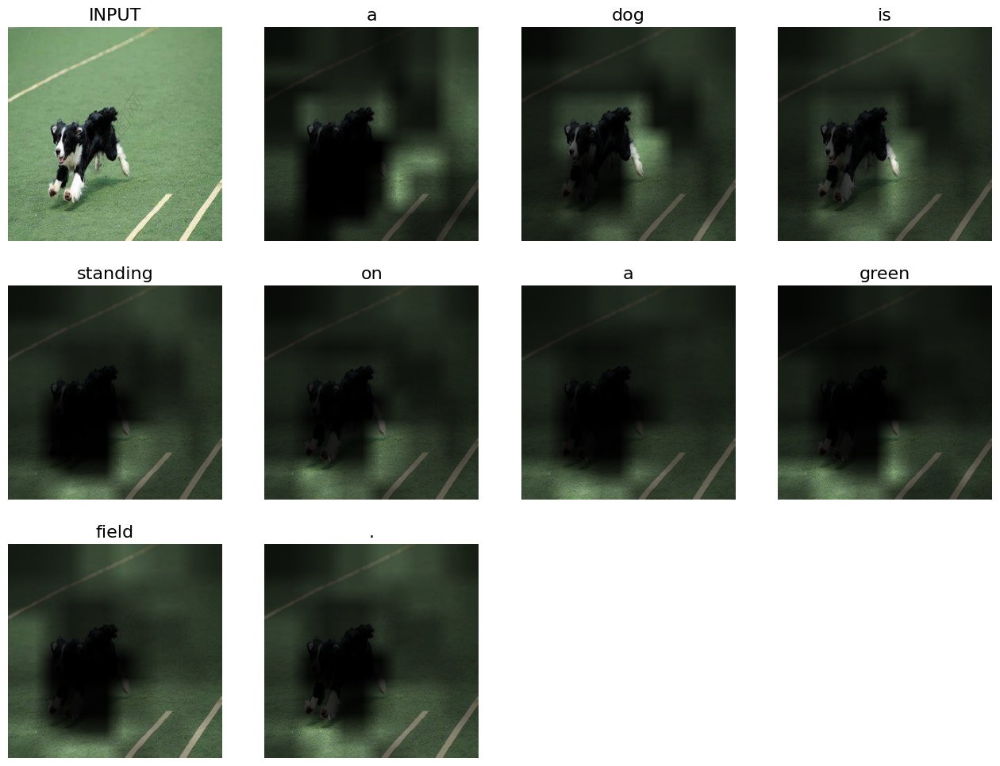

In [ ]:
## it seems the network cant tell whether it's standing or running
process_image(obtain_image(url="https://th.bing.com/th/id/OIP.jE0OUqpQ-ibDkUZe3wW-vwAAAA?rs=1&pid=ImgDetMain"))

a bird is flying in the air with a bird .
a bird is flying in the sky with a blue sky .
a bird with a purple flower in the background .
a bird with a red beak is flying in the sky .
a bird is flying through the sky with a blue sky .
a bird with a red beak and a red bird .
a bird with a red beak is flying in the background .
a bird is flying in the air with a red beak .
a bird with a blue and red beak is flying in the background .
a bird with a bird perched on a branch .


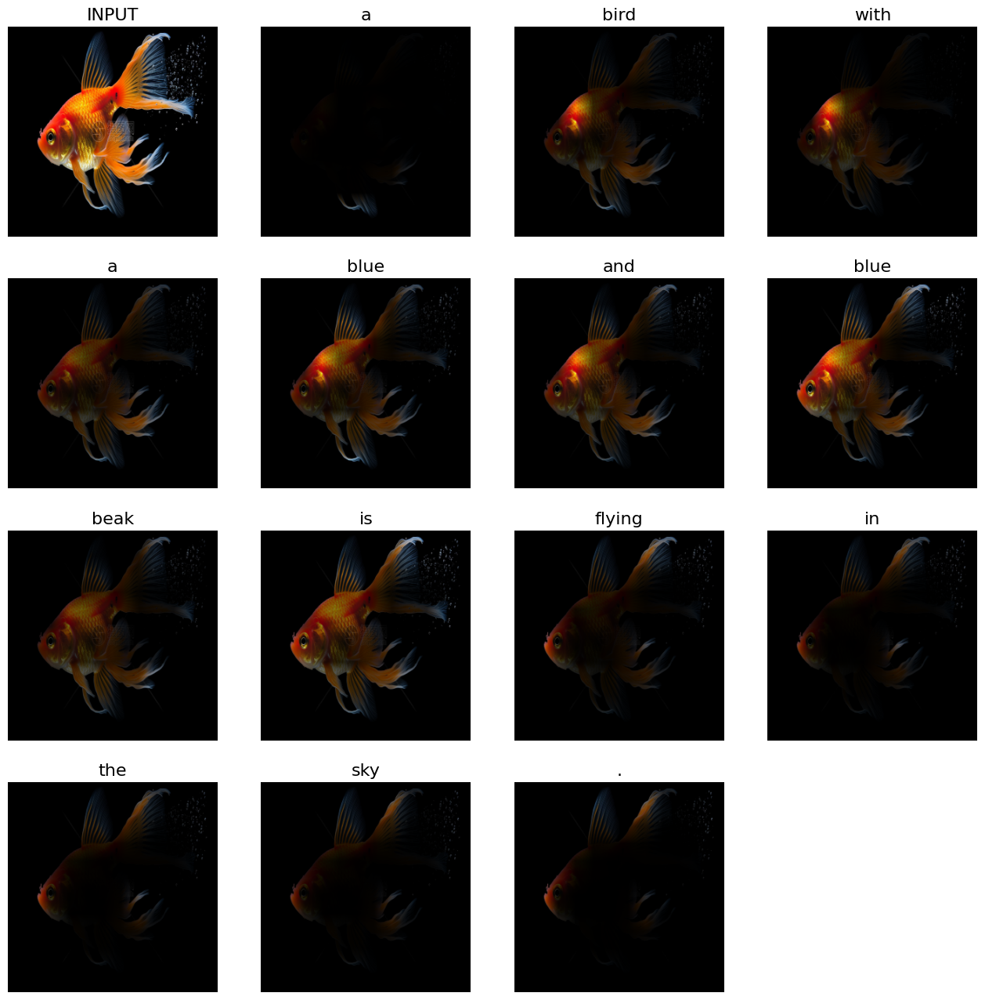

In [ ]:
process_image(obtain_image(url = "https://img95.699pic.com/photo/60023/5599.jpg_wh860.jpg"))

a cat laying on a bed with a white comforter .
a cat laying on a bed with a white comforter .
a cat laying on a bed with a white comforter .
a cat laying on a bed with a white comforter .
a cat laying on a bed with a white comforter .
a cat laying on a bed with a white comforter .
a cat laying on a bed with a white comforter .
a cat is laying on a bed with a white comforter .
a cat that is laying down on a bed .
a cat laying on a bed with a blanket .


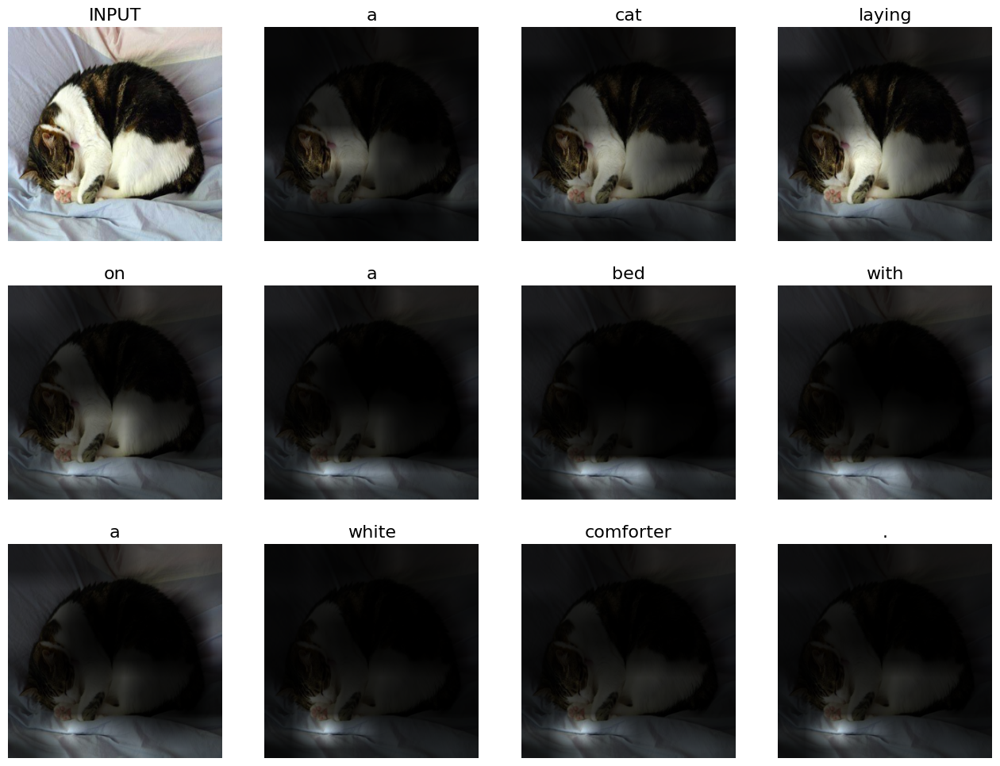

In [ ]:
process_image(obtain_image(url = "https://th.bing.com/th/id/OIP.DpDmD38awZDsRbTj6HJStQHaFj?rs=1&pid=ImgDetMain"))

a horse standing in the grass in a field .
a horse is walking in the grass with a frisbee .
a horse is walking in the grass with a black and white background .
a horse standing in a field with a large background .
a horse standing in a field with a large brown and white background .
a horse is standing in the grass with a frisbee .
a horse standing in a field with a green background .
a horse standing in the grass in the grass .
a horse is standing in the grass .
a horse is walking through the grass .


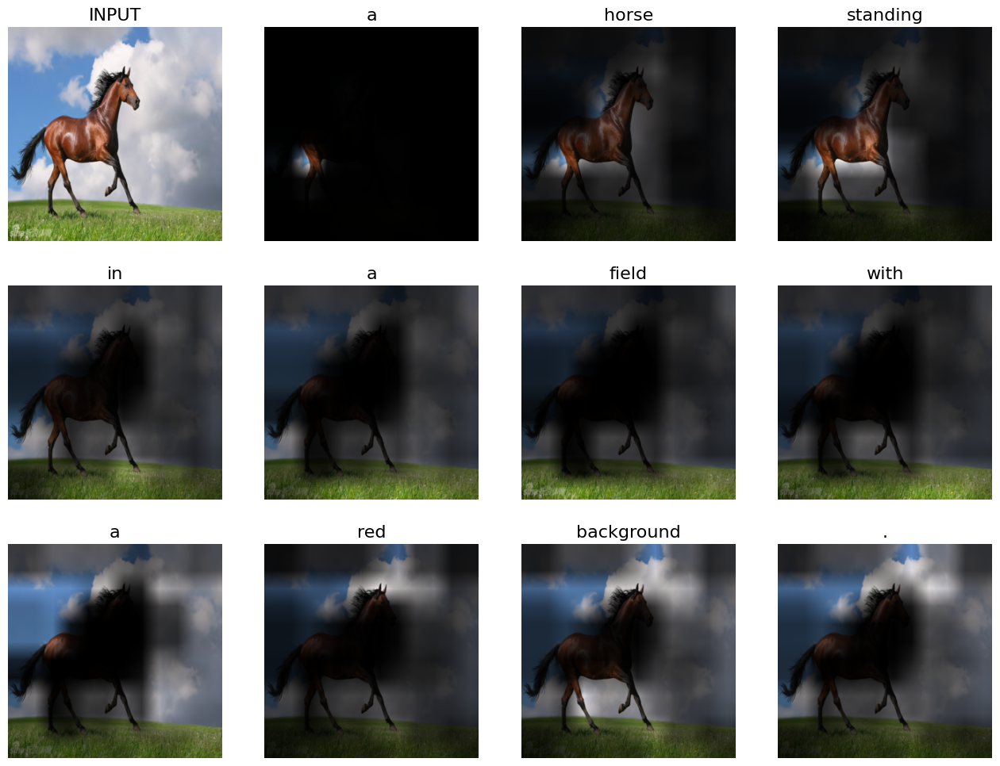

In [ ]:
## here it works perfectly
process_image(obtain_image(url="https://th.bing.com/th/id/R.801afc247fda983cb8062c38bc0184b1?rik=TdvUWo7RCJhfBQ&pid=ImgRaw&r=0&sres=1&sresct=1"))

a cow is standing in a field with a cow in the background .
a cow is standing in a field with a white cow .
a cow is standing in a field with a cow .
a cow is standing in a field with a cow .
a cow is standing in the grass with a cow .
a cow standing in a field with a brown and white cow .
a cow is standing in a field with a cow .
a cow is standing in a field with a cow in the background .
a cow is standing in a field with a cow .
a cow is standing in a field with a cow .


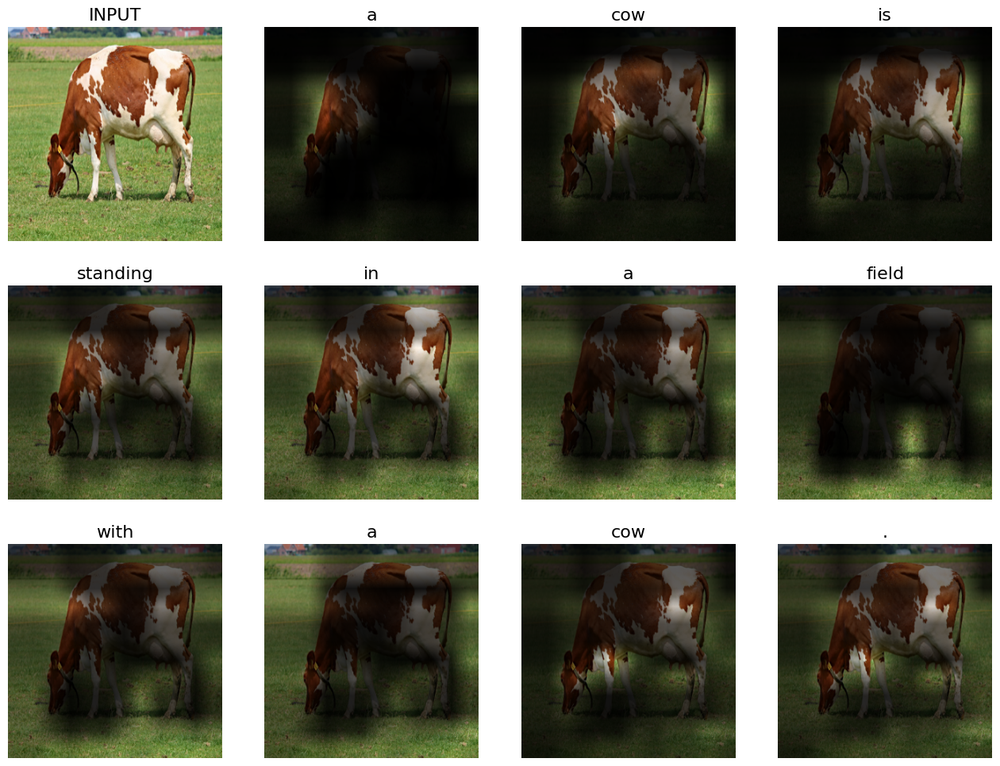

In [ ]:
## here the network recognizes a cow twice
process_image(obtain_image(url="https://th.bing.com/th/id/R.d3039e4f0c09586ea3e4ec16546af88e?rik=smicVzj%2fswE%2bVQ&riu=http%3a%2f%2fpic.616pic.com%2fphototwo%2f00%2f03%2f22%2f618b8f3dcebf17525.jpg&ehk=3pIki6LVKwCWDIXdrEPZT7m77M5Retid%2bu534HBWfxk%3d&risl=&pid=ImgRaw&r=0"))

two sheep standing in a field with a white background .
a sheep standing in a field with a sheep in the background .
a sheep standing in a field with a sheep .
a sheep standing in a field with a sheep .
a sheep standing in a field with a sheep .
a sheep standing in a field with a sheep .
two sheep standing in a field with a white background .
a sheep with a white and white sheep standing in a field .
a sheep with a white sheep standing in a field .
a sheep standing in a field with a sheep .


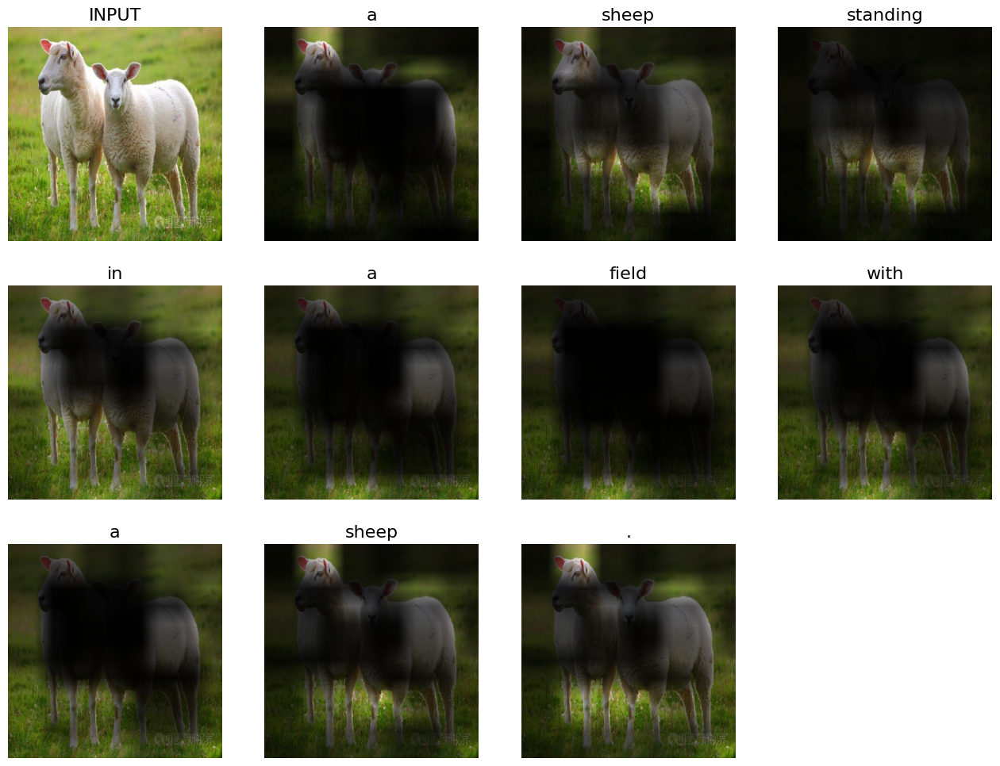

In [ ]:
process_image(obtain_image(url="https://img95.699pic.com/xsj/0k/kn/t5.jpg!/fw/700/watermark/url/L3hzai93YXRlcl9kZXRhaWwyLnBuZw/align/southeast"))

a bird flying in the sky with a sky background .
a bird flying in the sky with a sky background .
a bird flying in the sky with a sky .
a bird flying in the sky with a sky background .
a bird is flying in the sky with clouds .
a bird flying in the sky with a sky background .
a bird flying in the sky with a sky in the background .
a bird flying in the sky with a sky in the background .
a bird flying in the sky with a sky in the background .
a bird flying in the sky with a bird flying in the sky .


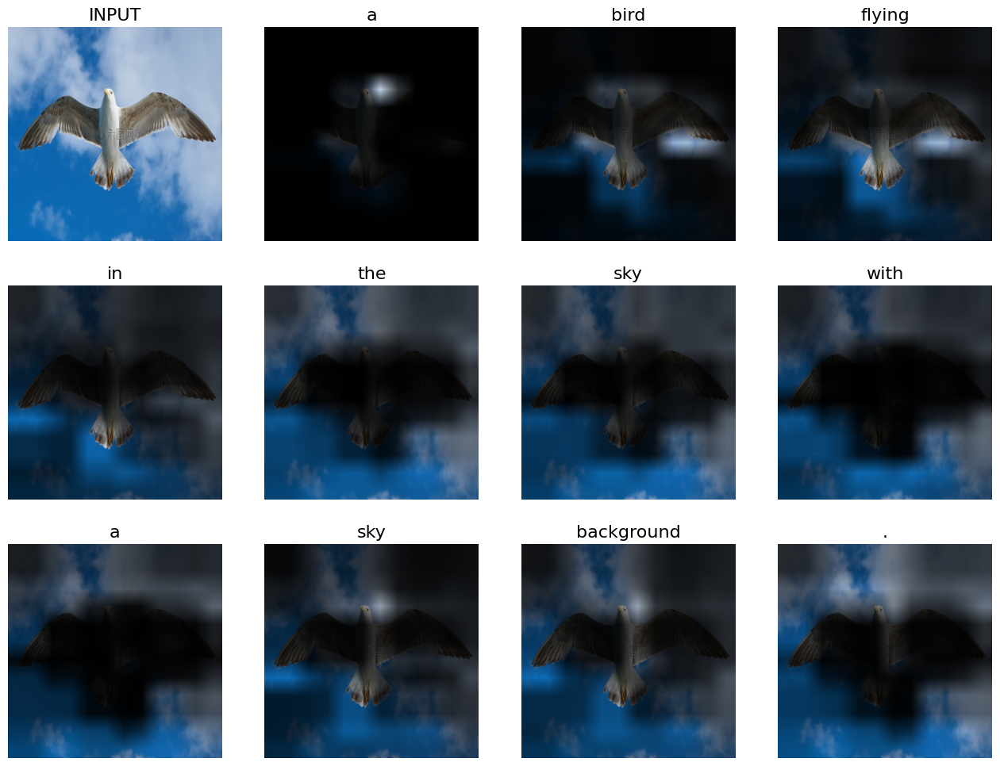

In [ ]:
process_image(obtain_image(url="https://photo.16pic.com/00/63/13/16pic_6313609_b.jpg"))

a group of people with red apples in the background .
a group of people that are in the same hand .
a group of stuffed animals are in a red and white background .
a group of fruits are in a red and white .
a group of stuffed animals are on a table .
a group of people that are in the blue .
a group of people that are eating a carrot .
a group of stuffed animals are in a red and white .
a group of people that are holding a stuffed toy .
a group of people with stuffed animals in the background .


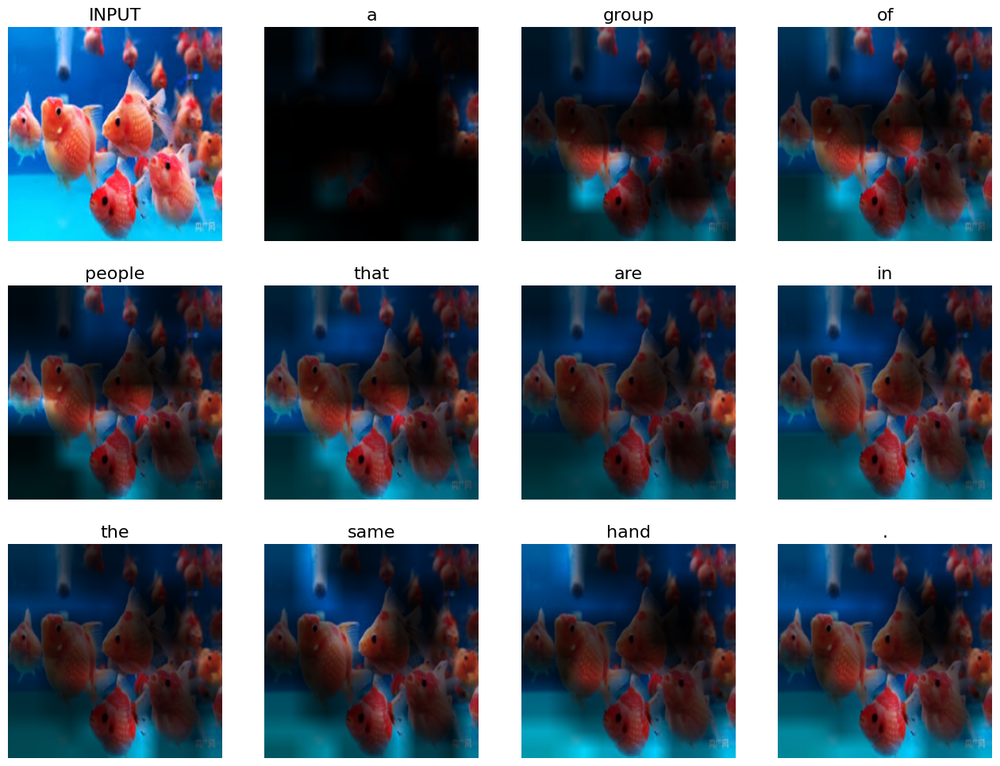

In [ ]:
process_image(obtain_image(url="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcThmWaVc5G1Eod7RMoqcljvhFv39-GDdzS_qw&s"))

### Conclusion
Here is a place for your conclusions, observations, hypotheses, and any other feedback.

In all this notebook has reached its purpose, in which I have already known the mechanism of the attention layers. It seems that this network doesnot recognize fishes. As I have searched on the Internet it should be because the MSCOCO dataset doesnot contain a label of fish, thus it is understandable.
Here goes a brief conclusion:

1.The Attention mechanism is combined with a pre-trained VGG19 network to generate feature representations of images.These features are used as input to the LSTM network and further combined with the Attention mechanism to generate text descriptions.

2.In general,this network is well trained and its loss has been around 3.2 close to the result in the example.And in most ways it works well.

3.There is problem, however, that the attention mechanism repeatedly take one thing into account, like the cow image above, there is only one cow in the image but the text generated says that a cow is there with a cow which is apparently incorrect. This is perhaps because the attention mechanism fails to correctly focus on a specific area in the image during description generation. It may distribute attention to different parts of the same cow (such as the head and body) multiple times during the description process, thus misclassifying it as two cows, which can be seen in the image.

4.The network tend to recognize the background as red color which is not always correct, this may due to the dataset or the VGG network. Perhaps the red background happened in the dataset many times or Feature extraction network (here VGG19) may incorrectly extract certain areas in the image (such as light-colored objects or warm-lit areas) as red-related features.

5.still some minor problems not identified, like the boy holding a basketball recognized as holding a baseball bat, perhaps also due to the dataset?

In all this is a quite interesting subject, cant wait to implement it in my own project

### Now what?

Your model produces some captions but you still strive to improve it? You're damn right to do so. Here are some ideas that go beyond simply "stacking more layers". The options are listed easiest to hardest.

##### Attention
You can build better and more interpretable captioning model with attention over the generated part of the sentense.

##### Subword level captioning
In the base version, we replace all rare words with UNKs which throws away a lot of information and reduces quality. A better way to deal with vocabulary size problem would be to use Byte-Pair Encoding

* BPE implementation you can use: [github_repo](https://github.com/rsennrich/subword-nmt).
* Theory: https://arxiv.org/abs/1508.07909
* It was originally built for machine translation, but it should work with captioning just as well.

#### Reinforcement learning
* After your model has been pre-trained in a teacher forced way, you can tune for captioning-speific models like CIDEr.
* Tutorial on RL for sequence models: [practical_rl week8](https://github.com/yandexdataschool/Practical_RL/tree/master/week8_scst)
* Theory: https://arxiv.org/abs/1612.00563